# Analyzing SAT Scores of High Schoolers

### SAT Scores
The SAT, or Scholastic Aptitude Test, is a test that high schoolers take in the US before applying to college. Colleges take the test scores into account when making admissions decisions, so it's fairly important to do well on. The test is divided into 3 sections, each of which is scored out of 800 points. The total score is out of 2400 (although this has changed back and forth a few times, the scores in this dataset are out of 2400). High schools are often ranked by their average SAT scores, and high SAT scores are considered a sign of how good a school district is.

## Objective of Project
There have been allegations about the SAT being unfair to certain racial groups in the US, so doing this analysis on New York City data will help shed some light on the fairness of the SAT.

## Data Sources-
1. https://data.cityofnewyork.us/Education/SAT-Results/f9bf-2cp4
2. https://data.cityofnewyork.us/Education/DOE-High-School-Directory-2014-2015/n3p6-zve2

### Supplementing the Data
In this case, there are several related datasets on the same website that cover demographic information and test scores.

Here are the links to all of the datasets we'll be using:

1. SAT scores by school — SAT scores for each high school in New York City. (https://data.cityofnewyork.us/Education/SAT-Results/f9bf-2cp4)
2. School attendance — attendance information on every school in NYC. (https://data.cityofnewyork.us/Education/School-Attendance-and-Enrollment-Statistics-by-Dis/7z8d-msnt)
3. Math test results — math test results for every school in NYC. (https://data.cityofnewyork.us/Education/NYS-Math-Test-Results-By-Grade-2006-2011-School-Le/jufi-gzgp)
4. Class size — class size information for each school in NYC. (https://data.cityofnewyork.us/Education/2010-2011-Class-Size-School-level-detail/urz7-pzb3)
5. AP test results — Advanced Placement exam results for each high school. Passing AP exams can get you college credit in the US. (https://data.cityofnewyork.us/Education/AP-College-Board-2010-School-Level-Results/itfs-ms3e)
6. Graduation outcomes — percentage of students who graduated, and other outcome information. (https://data.cityofnewyork.us/Education/Graduation-Outcomes-Classes-Of-2005-2010-School-Le/vh2h-md7a)
7. Demographics — demographic information for each school. (https://data.cityofnewyork.us/Education/School-Demographics-and-Accountability-Snapshot-20/ihfw-zy9j)
8. School survey — surveys of parents, teachers, and students at each school. (https://data.cityofnewyork.us/Education/NYC-School-Survey-2011/mnz3-dyi8)
9. School district maps — contains information on the layout of the school districts, so that we can map them out. (https://data.cityofnewyork.us/Education/School-Districts/r8nu-ymqj)

All of these datasets are interrelated, and we'll be able to combine them before we do any analysis.

## Getting Background Information

Before diving into analyzing the data, it's useful to research some background information. In this case, we know a few facts that will be useful:

1. New York City is divided into 5 boroughs, which are essentially distinct regions.
2. Schools in New York City are divided into several school district, each of which can contains dozens of schools.
3. Not all the schools in all of the datasets are high schools, so we'll need to do some data cleaning.
4. Each school in New York City has a unique code called a DBN, or District Borough Number.
5. By aggregating data by district, we can use the district mapping data to plot district-by-district differences.

## Understanding the data

In [1]:
import pandas as pd
import numpy as np

Firstly, we will upload all csv files data on the python data dictionary.

In [2]:
files = ['ap_2010.csv','hs_directory.csv','sat_results.csv','graduation.csv','math_test_results.csv','class_size.csv','demographics.csv']

In [3]:
data = {}
for f in files:
    d = pd.read_csv("{0}".format(f))
    data[f.replace(".csv","")]=d

Now, we will loop through all items in dictionary and view its head data set.

In [4]:
for k,v in data.items():
    print("\n" + k + "\n")
    print(v.head())


ap_2010

      DBN                             SchoolName AP Test Takers   \
0  01M448           UNIVERSITY NEIGHBORHOOD H.S.              39   
1  01M450                 EAST SIDE COMMUNITY HS              19   
2  01M515                    LOWER EASTSIDE PREP              24   
3  01M539         NEW EXPLORATIONS SCI,TECH,MATH             255   
4  02M296  High School of Hospitality Management               s   

  Total Exams Taken Number of Exams with scores 3 4 or 5  
0                49                                   10  
1                21                                    s  
2                26                                   24  
3               377                                  191  
4                 s                                    s  

hs_directory

      dbn                                        school_name    borough  \
0  17K548                Brooklyn School for Music & Theatre   Brooklyn   
1  09X543                   High School for Violin and Dance  

      DBN                       Name  schoolyear fl_percent  frl_percent  \
0  01M015  P.S. 015 ROBERTO CLEMENTE    20052006       89.4          NaN   
1  01M015  P.S. 015 ROBERTO CLEMENTE    20062007       89.4          NaN   
2  01M015  P.S. 015 ROBERTO CLEMENTE    20072008       89.4          NaN   
3  01M015  P.S. 015 ROBERTO CLEMENTE    20082009       89.4          NaN   
4  01M015  P.S. 015 ROBERTO CLEMENTE    20092010                    96.5   

   total_enrollment prek   k grade1 grade2    ...     black_num black_per  \
0               281   15  36     40     33    ...            74      26.3   
1               243   15  29     39     38    ...            68      28.0   
2               261   18  43     39     36    ...            77      29.5   
3               252   17  37     44     32    ...            75      29.8   
4               208   16  40     28     32    ...            67      32.2   

  hispanic_num hispanic_per white_num white_per male_num male_per female_num  \


Some useful patterns in the datasets can be seen:

1. Most of the datasets contain a DBN column
2. Some fields look interesting for mapping, particularly Location 1, which contains coordinates inside a larger string.
3. Some of the datasets appear to contain multiple rows for each school (repeated DBN values), which means we'll have to do some preprocessing.

## Unifying the data

In order to work with the data more easily, we'll need to unify all the individual datasets into a single one. This will enable us to quickly compare columns across datasets. In order to do this, we'll first need to find a common column to unify them on. Looking at the output above, it appears that DBN might be that common column, as it appears in multiple datasets. DBN is a unique code for each school.

The problem now is that two of the datasets, class_size, and hs_directory, don't have a DBN field. In the hs_directory data, it's just named dbn, so we can just rename the column, or copy it over into a new column called DBN. In the class_size data, we'll need to try a different approach.

The DBN column looks like this:

In [5]:
data["demographics"]["DBN"].head()

0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
Name: DBN, dtype: object

If we look at the class_size data, here's what we'd see in the first 5 rows:

In [6]:
data["class_size"].head()

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN


It looks like the DBN is actually a combination of CSD, BOROUGH, and SCHOOL CODE. For those unfamiliar with New York City, it is composed of 5 boroughs. Each borough is an organizational unit, and is about the same size as a fairly large US City. DBN stands for District Borough Number. It looks like CSD is the District, BOROUGH is the borough, and when combined with the SCHOOL CODE, forms the DBN. There's no systematized way to find insights like this in data, and it requires some exploration and playing around to figure out.

Now that we know how to construct the DBN, we can add it into the class_size and hs_directory datasets:

In [7]:
data["class_size"]["DBN"]=data["class_size"].apply(lambda x:"{0:02d}{1}".format(x["CSD"],x["SCHOOL CODE"]), axis=1)

In [8]:
data["hs_directory"]["DBN"] = data["hs_directory"]["dbn"]

## Adding in the surveys

One of the most potentially interesting datasets to look at is the dataset on student, parent, and teacher surveys about the quality of schools. These surveys include information about the perceived safety of each school, academic standards, and more. Before we combine our datasets, let's add in the survey data.

In this case, we'll add the survey data into our data dictionary, and then combine all the datasets afterwards. The survey data consists of 2 files, one for all schools, and one for school district 75. We'll need to write some code to combine them. In the below code, we'll:

1. Read in the surveys for all schools using the windows-1252 file encoding.
2. Read in the surveys for district 75 schools using the windows-1252 file encoding.
3. Add a flag that indicates which school district each dataset is for.
4. Combine the datasets into one using the concat method on DataFrames

In [9]:
survey1 = pd.read_csv("survey_all.txt", delimiter="\t", encoding='windows-1252')
survey2 = pd.read_csv("survey_d75.txt", delimiter="\t", encoding='windows-1252')

In [10]:
survey1["d75"] = False
survey2["d75"] = True
survey = pd.concat([survey1, survey2], axis=0)

Once we have the surveys combined, there's an additional complication. We want to minimize the number of columns in our combined dataset so we can easily compare columns and figure out correlations. Unfortunately, the survey data has many columns that aren't very useful to us:

In [11]:
survey.head()

,N_p,N_s,N_t,aca_p_11,aca_s_11,aca_t_11,aca_tot_11,bn,com_p_11,com_s_11,...,t_q8c_1,t_q8c_2,t_q8c_3,t_q8c_4,t_q9,t_q9_1,t_q9_2,t_q9_3,t_q9_4,t_q9_5
0,90.0,NaN,22.0,7.8,NaN,7.9,7.9,M015,7.6,NaN,...,29.0,67.0,5.0,0.0,NaN,5.0,14.0,52.0,24.0,5.0
1,161.0,NaN,34.0,7.8,NaN,9.1,8.4,M019,7.6,NaN,...,74.0,21.0,6.0,0.0,NaN,3.0,6.0,3.0,78.0,9.0
2,367.0,NaN,42.0,8.6,NaN,7.5,8.0,M020,8.3,NaN,...,33.0,35.0,20.0,13.0,NaN,3.0,5.0,16.0,70.0,5.0
3,151.0,145.0,29.0,8.5,7.4,7.8,7.9,M034,8.2,5.9,...,21.0,45.0,28.0,7.0,NaN,0.0,18.0,32.0,39.0,11.0
4,90.0,NaN,23.0,7.9,NaN,8.1,8.0,M063,7.9,NaN,...,59.0,36.0,5.0,0.0,NaN,10.0,5.0,10.0,60.0,15.0


We can resolve this issue by looking at the data dictionary file that we downloaded along with the survey data. The file tells us the important fields in the data and solving it.

In [12]:
survey["DBN"] = survey["dbn"]
survey_fields = ["DBN", "rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_p_11", "com_p_11", "eng_p_11", "aca_p_11", "saf_t_11", "com_t_11", "eng_t_10", "aca_t_11", "saf_s_11", "com_s_11", "eng_s_11", "aca_s_11", "saf_tot_11", "com_tot_11", "eng_tot_11", "aca_tot_11",]
survey = survey.loc[:,survey_fields]
data["survey"] = survey
survey.shape

C:\Users\user\Miniconda3\envs\av\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\user\Miniconda3\envs\av\lib\site-packages\pandas\core\indexing.py:1367: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


(1702, 23)

## Condensing datasets

If we take a look at some of the datasets, including class_size, we'll immediately see a problem:

In [13]:
data["class_size"].head()

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO,DBN
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN,01M015
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN,01M015
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN,01M015


There are several rows for each high school (as you can see by the repeated DBN and SCHOOL NAME fields). However, if we take a look at the sat_results dataset, it only has one row per high school:

In [14]:
data["sat_results"].head()

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355,404,363
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383,423,366
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377,402,370
3,01M458,FORSYTH SATELLITE ACADEMY,7,414,401,359
4,01M509,MARTA VALLE HIGH SCHOOL,44,390,433,384


In order to combine these datasets, we'll need to find a way to condense datasets like class_size to the point where there's only a single row per high school. If not, there won't be a way to compare SAT scores to class size. We can accomplish this by first understanding the data better, then by doing some aggregation. With the class_size dataset, it looks like GRADE and PROGRAM TYPE have multiple values for each school. By restricting each field to a single value, we can filter most of the duplicate rows. In the below code, we:

1. Only select values from class_size where the GRADE field is 09-12.
2. Only select values from class_size where the PROGRAM TYPE field is GEN ED.
3. Group the class_size dataset by DBN, and take the average of each column. Essentially, we'll find the average class_size values for each school.
4. Reset the index, so DBN is added back in as a column.

In [15]:
class_size = data["class_size"]
class_size = class_size[class_size["GRADE "] == "09-12"]
class_size = class_size[class_size["PROGRAM TYPE"] == "GEN ED"]
class_size = class_size.groupby("DBN").agg(np.mean)
class_size.reset_index(inplace=True)
data["class_size"] = class_size

## Condensing other datasets

Next, we'll need to condense the demographics dataset. The data was collected for multiple years for the same schools, so there are duplicate rows for each school. We'll only pick rows where the schoolyear field is the most recent available:

In [16]:
demographics = data["demographics"]
demographics = demographics[demographics["schoolyear"] == 20112012]
data["demographics"] = demographics

We'll need to condense the math_test_results dataset. This dataset is segmented by Grade and by Year. We can select only a single grade from a single year:

In [17]:
data["math_test_results"] = data["math_test_results"][data["math_test_results"]["Year"] == 2011]
data["math_test_results"] = data["math_test_results"][data["math_test_results"]["Grade"] == '8']

Finally, graduation needs to be condensed:

In [18]:
data["graduation"] = data["graduation"][data["graduation"]["Cohort"] == "2006"]
data["graduation"] = data["graduation"][data["graduation"]["Demographic"] == "Total Cohort"]

## Computing Variables

Computing variables can help speed up our analysis by enabling us to make comparisons more quickly, and enable us to make comparisons that we otherwise wouldn't be able to do. The first thing we can do is compute a total SAT score from the individual columns SAT Math Avg. Score, SAT Critical Reading Avg. Score, and SAT Writing Avg. Score. In the below code, we:

1. Convert each of the SAT score columns from a string to a number.
2. Add together all of the columns to get the sat_score column, which is the total SAT score.

In [19]:
cols = ['SAT Math Avg. Score', 'SAT Critical Reading Avg. Score', 'SAT Writing Avg. Score']
for c in cols:
    data["sat_results"][c] = data["sat_results"][c].convert_objects(convert_numeric=True)

data['sat_results']['sat_score'] = data['sat_results'][cols[0]] + data['sat_results'][cols[1]] + data['sat_results'][cols[2]]

C:\Users\user\Miniconda3\envs\av\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  This is separate from the ipykernel package so we can avoid doing imports until


Next, we'll need to parse out the coordinate locations of each school, so we can make maps. This will enable us to plot the location of each school. In the below code, we:

1. Parse latitude and longitude columns from the Location 1 column.
2. Convert lat and lon to be numeric.

In [20]:
data["hs_directory"]['lat'] = data["hs_directory"]['Location 1'].apply(lambda x: x.split("\n")[-1].replace("(", "").replace(")", "").split(", ")[0])
data["hs_directory"]['lon'] = data["hs_directory"]['Location 1'].apply(lambda x: x.split("\n")[-1].replace("(", "").replace(")", "").split(", ")[1])

for c in ['lat', 'lon']:
    data["hs_directory"][c] = data["hs_directory"][c].convert_objects(convert_numeric=True)

C:\Users\user\Miniconda3\envs\av\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  """


Now, we can print out each dataset to see what we have:

In [21]:
for k,v in data.items():
    print(k)
    print(v.head())

ap_2010
      DBN                             SchoolName AP Test Takers   \
0  01M448           UNIVERSITY NEIGHBORHOOD H.S.              39   
1  01M450                 EAST SIDE COMMUNITY HS              19   
2  01M515                    LOWER EASTSIDE PREP              24   
3  01M539         NEW EXPLORATIONS SCI,TECH,MATH             255   
4  02M296  High School of Hospitality Management               s   

  Total Exams Taken Number of Exams with scores 3 4 or 5  
0                49                                   10  
1                21                                    s  
2                26                                   24  
3               377                                  191  
4                 s                                    s  
hs_directory
      dbn                                        school_name    borough  \
0  17K548                Brooklyn School for Music & Theatre   Brooklyn   
1  09X543                   High School for Violin and Dance      

## Combining the datasets

Now that we've done all the preliminaries, we can combine the datasets together using the DBN column. At the end, we'll have a dataset with hundreds of columns, from each of the original datasets. When we join them, it's important to note that some of the datasets are missing high schools that exist in the sat_results dataset. To resolve this, we'll need to merge the datasets that have missing rows using the outer join strategy, so we don't lose data.

In the below code, we'll:

1. Loop through each of the items in the data dictionary.
2. Print the number of non-unique DBNs in the item.
3. Decide on a join strategy -- inner or outer.
4. Join the item to the DataFrame full using the column DBN.

In [22]:
flat_data_names = [k for k,v in data.items()]
flat_data = [data[k] for k in flat_data_names]
full = flat_data[0]
for i, f in enumerate(flat_data[1:]):
    name = flat_data_names[i+1]
    print(name)
    print(len(f["DBN"]) - len(f["DBN"].unique()))
    join_type = "inner"
    if name in ["sat_results", "ap_2010", "graduation"]:
        join_type = "outer"
    if name not in ["math_test_results"]:
        full = full.merge(f, on="DBN", how=join_type)

full.shape

hs_directory
0
sat_results
0
graduation
0
math_test_results
0
class_size
0
demographics
0
survey
0


(435, 165)

## Adding in values

Now that we have our full DataFrame, we have almost all the information we'll need to do our analysis. There are a few missing pieces, though. We may want to correlate the Advanced Placement exam results with SAT scores, but we'll need to first convert those columns to numbers, then fill in any missing values:

In [23]:
cols = ['AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5']

for col in cols:
    full[col] = full[col].convert_objects(convert_numeric=True)

full[cols] = full[cols].fillna(value=0)

C:\Users\user\Miniconda3\envs\av\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  after removing the cwd from sys.path.


In [24]:
cols = ['AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5']

for col in cols:
    full[col] = full[col].convert_objects(convert_numeric=True)

full[cols] = full[cols].fillna(value=0)

C:\Users\user\Miniconda3\envs\av\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  after removing the cwd from sys.path.


Then, we'll need to calculate a school_dist column that indicates the school district of the school. This will enable us to match up school districts and plot out district-level statistics using the district maps we downloaded earlier:

In [25]:
full["school_dist"] = full["DBN"].apply(lambda x: x[:2])

Finally, we'll need to fill in any missing values in full with the mean of the column, so we can compute correlations:

In [26]:
full = full.fillna(full.mean())

## Computing Correlations

A good way to explore a dataset and see what columns are related to the one you care about is to compute correlations. This will tell you which columns are closely related to the column you're interested in. We can do this via the corr method on Pandas DataFrames. The closer to 0 the correlation, the weaker the connection. The closer to 1, the stronger the positive correlation, and the closer to -1, the stronger the negative correlation:

In [27]:
full.corr()['sat_score']

AP Test Takers                          0.576830
Total Exams Taken                       0.564531
Number of Exams with scores 3 4 or 5    0.561350
grade_span_min                          0.021111
grade_span_max                               NaN
expgrade_span_min                            NaN
expgrade_span_max                            NaN
postcode                               -0.041746
total_students                          0.335770
number_programs                         0.057333
Community Board                         0.022050
Council District                       -0.039139
Census Tract                            0.070780
BIN                                     0.053956
BBL                                     0.045042
lat                                    -0.155988
lon                                    -0.119321
SAT Critical Reading Avg. Score         0.976825
SAT Math Avg. Score                     0.956405
SAT Writing Avg. Score                  0.981704
sat_score           

This gives us quite a few insights that we'll need to explore:

1. Total enrollment correlates strongly with sat_score, which is surprising, because you'd think smaller schools, which focused more on the student, would have higher scores.
2. The percentage of females at a school (female_per) correlates positively with SAT score, whereas the percentage of males (male_per) correlates negatively.
3. None of the survey responses correlate highly with SAT scores.
4. There is a significant racial inequality in SAT scores (white_per, asian_per, black_per, hispanic_per).
5. ell_percent correlates strongly negatively with SAT scores.

Each of these items is a potential angle to explore and tell a story about using the data.

## Setting the context

Before we dive into exploring the data, we'll want to set the context, both for ourselves, and anyone else that reads our analysis. One good way to do this is with exploratory charts or maps. In this case, we'll map out the positions of the schools, which will help readers understand the problem we're exploring.

In the below code, we:

1. Setup a map centered on New York City.
2. Add a marker to the map for each high school in the city.
3. Display the map.

In [43]:
import folium
from folium import plugins
from folium.plugins import MarkerCluster

schools_map = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(schools_map)
for name, row in full.iterrows():
    folium.Marker([row["lat"], row["lon"]], popup="{0}: {1}".format(row["DBN"], row["school_name"])).add_to(marker_cluster)
schools_map.save('schools.html')
schools_map

This map is helpful, but it's hard to see where the most schools are in NYC. Instead, we'll make a heatmap:

In [29]:
schools_heatmap = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
schools_heatmap.add_child(plugins.HeatMap([[row["lat"], row["lon"]] for name, row in full.iterrows()]))
schools_heatmap.save("heatmap.html")
schools_heatmap

## District Level Mapping

Heatmaps are good for mapping out gradients, but we'll want something with more structure to plot our differences in SAT score across the city. School districts are a good way to visualize this information, as each district has its own administration. New York City has several dozen school districts, and each district is a small geographic area.

We can compute SAT score by school district, then plot this out on a map. In the below code, we'll:
1. Group full by school district
2. Compute the average of each column for each school district
3. Convert the school_dist field to remove leading 0s, so we can match our geographic district data.

In [30]:
district_data = full.groupby("school_dist").agg(np.mean)
district_data.reset_index(inplace=True)
district_data["school_dist"] = district_data["school_dist"].apply(lambda x:str(int(x)))

We will now be able to plot the average SAT score in each school district. In order to do this, we'll read in data in GeoJSON format to the get the shapes of each district, then match each district shape with SAT score using the school_dist column, then finally create the plot:

In [31]:
def show_district_map(col):
    geo_path = "districts.geojson"
    districts = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
    districts.choropleth(
        geo_data=geo_path,
        data=district_data,
        columns=['school_dist', col],
        key_on='feature.properties.school_dist',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
    )
    districts.save("districts.html")
    return districts

show_district_map("sat_score")

## Exploring enrollment and SAT Scores

Till now, we've set the context by plotting out where the schools are, and SAT score by district, giving better idea of the context behind the dataset.Now that we've set the stage, we can move into exploring the angles we identified earlier, when we were finding correlations. The first angle to explore is the relationship between the number of students enrolled in a school and SAT score.

We can explore this with a scatter plot that compares total enrollment across all schools to SAT scores across all schools.

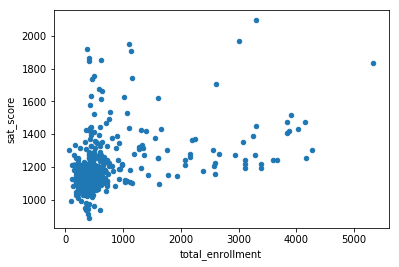

In [32]:
%matplotlib inline

full.plot.scatter(x='total_enrollment', y='sat_score')

As you can see, there's a cluster at the bottom left with low total enrollment and low SAT scores. Other than this cluster, there appears to only be a slight positive correlation between SAT scores and total enrollment. Graphing out correlations can reveal unexpected patterns.

We can explore this further by getting the names of the schools with low enrollment and low SAT scores:

In [33]:
full[(full["total_enrollment"] < 1000) & (full["sat_score"] < 1000)]["School Name"]

78                                       NaN
88     KINGSBRIDGE INTERNATIONAL HIGH SCHOOL
90     INTERNATIONAL SCHOOL FOR LIBERAL ARTS
155                MULTICULTURAL HIGH SCHOOL
286      INTERNATIONAL COMMUNITY HIGH SCHOOL
306          BRONX INTERNATIONAL HIGH SCHOOL
326                                      NaN
330            HIGH SCHOOL OF WORLD CULTURES
335       BROOKLYN INTERNATIONAL HIGH SCHOOL
352                      PACIFIC HIGH SCHOOL
361    INTERNATIONAL HIGH SCHOOL AT PROSPECT
369               IT TAKES A VILLAGE ACADEMY
397     ASPIRATIONS DIPLOMA PLUS HIGH SCHOOL
400    PAN AMERICAN INTERNATIONAL HIGH SCHOO
Name: School Name, dtype: object

### Observation
Some searching on Google shows that most of these schools are for students who are learning English, and are low enrollment as a result. This exploration showed us that it's not total enrollment that's correlated to SAT score -- it's whether or not students in the school are learning English as a second language or not.

## Exploring English learners and SAT scores

Now that we know the percentage of English language learners in a school is correlated with lower SAT scores, we can explore the relationship. The ell_percent column is the percentage of students in each school who are learning English. We can make a scatterplot of this relationship:

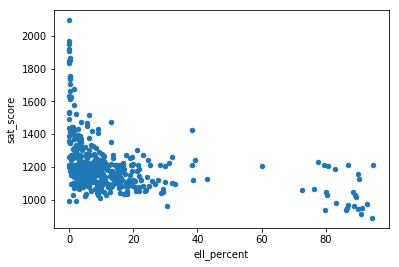

In [34]:
full.plot.scatter(x='ell_percent',y='sat_score')

It looks like there are a group of schools with a high ell_percentage that also have low average SAT scores. We can investigate this at the district level, by figuring out the percentage of English language learners in each district, and seeing it if matches our map of SAT scores by district:

In [35]:
show_district_map("ell_percent")

## Observation

It can be seen by looking at two district level maps, districts with a low proportion of ELL learners tend to have high SAT scores, and vice versa.

## Correlating survey scores and SAT scores

It would be fair to assume that the results of students, parents, and teacher surveys would have a large correlation with SAT scores. It makes sense that schools with high academic expectations, for instance, would tend to have higher SAT scores. To test this theory, lets plot SAT scores and the various survey metrics:

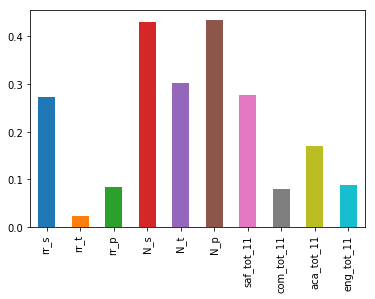

In [36]:
full.corr()["sat_score"][["rr_s","rr_t","rr_p","N_s","N_t","N_p","saf_tot_11","com_tot_11","aca_tot_11","eng_tot_11"]].plot.bar()

Surprisingly, the two factors that correlate the most are N_p and N_s, which are the counts of parents and students who responded to the surveys. Both strongly correlate with total enrollment, so are likely biased by the ell_learners. The other metric that correlates most is saf_t_11. That is how safe students, parents and teachers perceived the school to be. It makes sense that the safer the school, the more comfortable students feel learning in the environment. However, none of other factors, like engagement, communication and academic expectations, correlated with SAT scores. This may indicate that NYC is asking the wrong questions in the surveys, or thinking about the wrong factors (if their goal is to improve SAT scores, it may not be).

## Exploring race and SAT scores

One of the other angles to investigate involves race and SAT scores. There was a large correlation differential, and plotting it out will help us understand what's happening:

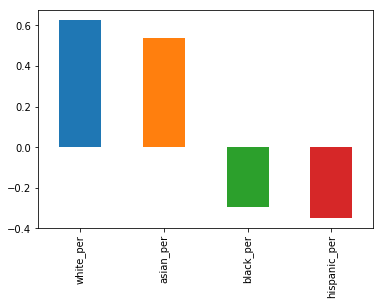

In [44]:
full.corr()["sat_score"][["white_per","asian_per","black_per","hispanic_per"]].plot.bar()

It looks like the higher percentages of white and asian students correlate with higher SAT scores, but higher percentages of black and hispanic students correlate with lower SAT scores. For hispanic students, this may be due to the fact that there are more recent immigrants who are ELL learners. We can map the hispanic percentage by district to eyeball the correlation:

In [45]:
show_district_map("hispanic_per")

It looks like there is some correlation with ELL percentage, but it will be necessary to do some more digging into this and other racial differences in SAT scores.

## Gender differences in SAT Scores

The final angle to explore is the relationship between gender and SAT score. We noted that a higher percentage of females in a school tends to correlate with higher SAT scores. We can visualize this with a bar graph:

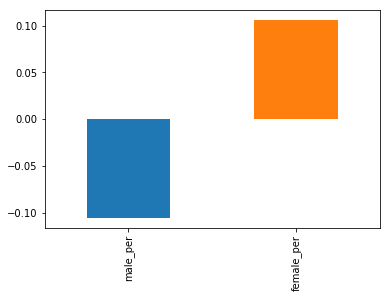

In [46]:
full.corr()["sat_score"][["male_per","female_per"]].plot.bar()

To dig more into the correlation, we can make a scatterplot of female_per and sat_score:

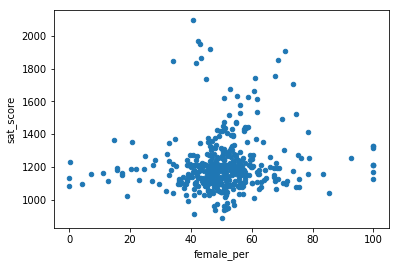

In [47]:
full.plot.scatter(x='female_per', y='sat_score')

It looks like there's a cluster of schools with a high percentage of females, and very high SAT scores (in the top right). We can get the names of the schools in this cluster:

In [48]:
full[(full["female_per"] > 65) & (full["sat_score"] > 1400)]["School Name"]

10            PROFESSIONAL PERFORMING ARTS HIGH SCH
14                    ELEANOR ROOSEVELT HIGH SCHOOL
22                     TALENT UNLIMITED HIGH SCHOOL
35             FIORELLO H. LAGUARDIA HIGH SCHOOL OF
185                     TOWNSEND HARRIS HIGH SCHOOL
212    FRANK SINATRA SCHOOL OF THE ARTS HIGH SCHOOL
233                  BARD HIGH SCHOOL EARLY COLLEGE
Name: School Name, dtype: object

Searching Google reveals that these are elite schools that focus on the performing arts. These schools tend to have higher percentages of females, and higher SAT scores. This likely accounts for the correlation between higher female percentages and SAT scores, and the inverse correlation between higher male percentages and lower SAT scores.

## AP Scores

So far, we've looked at demographic angles. One angle that we have the data to look at is the relationship between more students taking Advanced Placement exams and higher SAT scores. It makes sense that they would be correlated, since students who are high academic achievers tend to do better on the SAT.

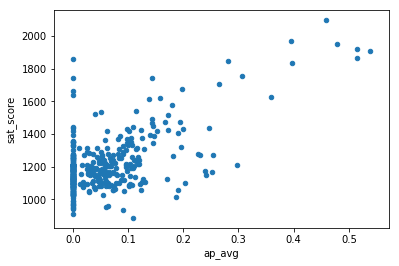

In [49]:
full["ap_avg"] = full["AP Test Takers "] / full["total_enrollment"]
full.plot.scatter(x='ap_avg', y='sat_score')

It looks like there is indeed a strong correlation between the two. An interesting cluster of schools is the one at the top right, which has high SAT scores and a high proportion of students that take the AP exams:

In [50]:
full[(full["ap_avg"] > .3) & (full["sat_score"] > 1700)]["School Name"]

14             ELEANOR ROOSEVELT HIGH SCHOOL
20                    STUYVESANT HIGH SCHOOL
99              BRONX HIGH SCHOOL OF SCIENCE
103    HIGH SCHOOL OF AMERICAN STUDIES AT LE
122           BROOKLYN TECHNICAL HIGH SCHOOL
185              TOWNSEND HARRIS HIGH SCHOOL
202    QUEENS HIGH SCHOOL FOR THE SCIENCES A
223      STATEN ISLAND TECHNICAL HIGH SCHOOL
Name: School Name, dtype: object

Some Google searching reveals that these are mostly highly selective schools where you need to take a test to get in. It makes sense that these schools would have high proportions of AP test takers.

## Thats all folks!!